In [1]:
# import numpy as np

# # !/usr/bin/env python3
# # -*- coding: utf-8 -*-
# """
# Created on 20181219

# @author: zhangji

# Trajection of a ellipse, Jeffery equation. 
# """

# %pylab inline
# pylab.rcParams['figure.figsize'] = (25, 11)
# fontsize = 40

# import numpy as np
# import scipy as sp
# from scipy.optimize import leastsq, curve_fit
# from scipy import interpolate
# from scipy.interpolate import interp1d
# from scipy.io import loadmat, savemat
# # import scipy.misc

# import matplotlib
# from matplotlib import pyplot as plt
# from matplotlib import animation, rc
# import matplotlib.ticker as mtick
# from mpl_toolkits.axes_grid1.inset_locator import inset_axes, zoomed_inset_axes
# from mpl_toolkits.mplot3d import Axes3D, axes3d

# from sympy import symbols, simplify, series, exp
# from sympy.matrices import Matrix
# from sympy.solvers import solve

# from IPython.display import display, HTML
# from tqdm import tqdm_notebook as tqdm
# import pandas as pd
# import re
# from scanf import scanf
# import os
# import glob

# from codeStore import support_fun as spf
# from src.support_class import *
# from src import stokes_flow as sf

# rc('animation', html='html5')
# PWD = os.getcwd()
# font = {'size': 20}
# matplotlib.rc('font', **font)
# np.set_printoptions(linewidth=90, precision=5)

import os
import glob
import natsort 
import numpy as np
import scipy as sp
from scipy.optimize import leastsq, curve_fit
from scipy import interpolate
from scipy import spatial
# from scipy.interpolate import interp1d
from scipy.io import loadmat, savemat
# import scipy.misc
import importlib
from IPython.display import display, HTML
import pandas as pd
import pickle

import matplotlib
from matplotlib import pyplot as plt
# from matplotlib import colors as mcolors
import matplotlib.colors as colors
from matplotlib import animation, rc
import matplotlib.ticker as mtick
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, zoomed_inset_axes
from mpl_toolkits.mplot3d import Axes3D, axes3d
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from mpl_toolkits.mplot3d.art3d import Line3DCollection
from matplotlib import cm

from time import time
from src.support_class import *
from src import jeffery_model as jm
from codeStore import support_fun as spf

# %matplotlib notebook

rc('animation', html='html5')
fontsize = 40
PWD = os.getcwd()

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:54: RuntimeWarning: divide by zero encountered in true_divide


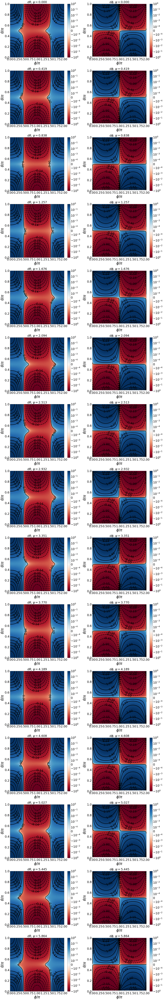

In [2]:
fig = plt.figure(figsize=(25, 150))
axs = fig.subplots(nrows=15, ncols=2)
fig.patch.set_facecolor('white')
cmap=plt.get_cmap('RdBu')
table_name = 'hlxB01_tau1a'
# t_path = '/home/zhangji/stokes_flow_master/src'

# Table  version, load date and interpolate. 
importlib.reload(jm)
ellipse_kwargs = {'name':         'ellipse',
                  'center':       np.zeros(3),
                  'norm':         np.array((1, 0, 0)),
                  'lateral_norm': np.array((0, 1, 0)),
                  'speed':        0,
                  'lbd':          np.nan, 
                  'table_name':   table_name, }
fileHandle = 'ShearTableProblem'
ellipse_obj = jm.TableObj(**ellipse_kwargs)
ellipse_obj.set_update_para(fix_x=False, fix_y=False, fix_z=False, update_order=1)
problem = jm.ShearTableProblem(name=fileHandle, planeShearRate=np.array((1, 0, 0)))
problem.add_obj(ellipse_obj)
intp_n_theta, intp_n_phi = 64, 128
ttheta, tphi = np.meshgrid(np.linspace(0, np.pi, intp_n_theta), np.linspace(0, 2 * np.pi, intp_n_phi))

dtheta_list = []
dphi_list = []
for tpsi, (axi, axj) in zip(ellipse_obj.intp_psi_list, axs):
    Table_Wx = []
    Table_Wy = []
    Table_Wz = []
    Table_dPx = []
    Table_dPy = []
    Table_dPz = []
    for theta, phi in zip(ttheta.flatten(), tphi.flatten()):
        P = np.array((np.sin(theta) * np.cos(phi), np.sin(theta) * np.sin(phi), np.cos(theta)))
        P2 = np.array((0, 1, 0))
        P2 = vector_rotation(P2, norm=np.array((0, 0, 1)), theta=tpsi)
        P2 = vector_rotation(P2, norm=np.array((0, 1, 0)), theta=theta)
        P2 = vector_rotation(P2, norm=np.array((0, 0, 1)), theta=phi)
        ref_U = ellipse_obj.get_velocity_at(np.zeros(3), P, P2, 0, 0)
        omega = ref_U[3:]
        dP = np.cross(omega, P)
        Table_Wx.append(omega[0])
        Table_Wy.append(omega[1])
        Table_Wz.append(omega[2])
        Table_dPx.append(dP[0])
        Table_dPy.append(dP[1])
        Table_dPz.append(dP[2])
    Wx = np.hstack(Table_Wx).reshape(ttheta.shape)
    Wy = np.hstack(Table_Wy).reshape(ttheta.shape)
    Wz = np.hstack(Table_Wz).reshape(ttheta.shape)

    dtheta = Wy * np.cos(tphi) - Wx * np.sin(tphi)
    dphi = Wz - (Wx * np.cos(tphi) + Wy * np.sin(tphi)) / np.tan(ttheta)
    dtheta_list.append(dtheta)
    dphi_list.append(dphi)
    # show dtheta
    plt.sca(axi)
    vmin, vmax = -1, 1
#     im = axi.pcolor(tphi / np.pi, ttheta / np.pi, dtheta, vmin=vmin, vmax=vmax, cmap=cmap, )
#     ticks = np.linspace(vmin, vmax, 9)
#     fig.colorbar(im, ticks=ticks, ax=axi).ax.tick_params(labelsize=fontsize*0.8)
    im = axi.pcolor(tphi / np.pi, ttheta / np.pi, dtheta, vmin=vmin, vmax=vmax, cmap=cmap, 
                    norm=colors.SymLogNorm(linthresh=0.0001, linscale=1, vmin=vmin, vmax=vmax))
    fig.colorbar(im, ax=axi).ax.tick_params(labelsize=fontsize*0.8)
    ticks = np.linspace(vmin, vmax, 15)
    im = axi.contour(tphi / np.pi, ttheta / np.pi, dtheta, 
                     ticks, linewidths=fontsize*0.1, colors='k')
    plt.clabel(im, fmt='%4.2f', colors='k', fontsize=fontsize*0.8, inline=0, rightside_up=1)
    axi.set_xlabel('$\\phi / \pi$', size=fontsize)
    axi.set_ylabel('$\\theta / \pi$', size=fontsize)
    axi.set_title('$d\\theta$, $\\psi=$%5.3f' % tpsi, size=fontsize*0.8)
    plt.xticks(fontsize=fontsize*0.8)
    plt.yticks(fontsize=fontsize*0.8)
    # show dphi
    plt.sca(axj)
    vmin, vmax = -1, 1
#     im = axj.pcolor(tphi / np.pi, ttheta / np.pi, dphi, vmin=vmin, vmax=vmax, cmap=cmap, 
#                     norm=colors.SymLogNorm(linthresh=0.1, linscale=1, vmin=vmin, vmax=vmax))
#     fig.colorbar(im, ax=axj).ax.tick_params(labelsize=fontsize*0.8)
    im = axj.pcolor(tphi / np.pi, ttheta / np.pi, dphi, vmin=vmin, vmax=vmax, cmap=cmap, 
                    norm=colors.SymLogNorm(linthresh=0.0001, linscale=1, vmin=vmin, vmax=vmax))
    fig.colorbar(im, ax=axj).ax.tick_params(labelsize=fontsize*0.8)
    n_tck_half = 7
    ticks = np.hstack((-10 ** np.linspace(1, -1, n_tck_half), 0, 10 ** np.linspace(-1, 1, n_tck_half)))
    linestyles = ['dashed'] * n_tck_half + ['solid'] * (n_tck_half + 1)
    im = axj.contour(tphi / np.pi, ttheta / np.pi, dphi, 
                     ticks, linewidths=fontsize*0.1, colors='k', linestyles=linestyles)
    plt.clabel(im, fmt='%4.2f', colors='k', fontsize=fontsize*0.8, inline=0, rightside_up=1)
    axj.set_xlabel('$\\phi / \pi$', size=fontsize)
    axj.set_ylabel('$\\theta / \pi$', size=fontsize)
    axj.set_title('$d\\phi$, $\\psi=$%5.3f' % tpsi, size=fontsize*0.8)
    plt.xticks(fontsize=fontsize*0.8)
    plt.yticks(fontsize=fontsize*0.8)
plt.tight_layout()

# dtheta = np.mean(np.dstack(dtheta_list), axis=2)
# dphi = np.mean(np.dstack(dphi_list), axis=2)
# tpick = (ttheta, tphi, dtheta, dphi)
# with open('dtheta_dphi.pickle', 'wb') as handle:
#     pickle.dump(tpick, handle, protocol=pickle.HIGHEST_PROTOCOL)
# print('save table_data to dtheta_dphi.pickle')

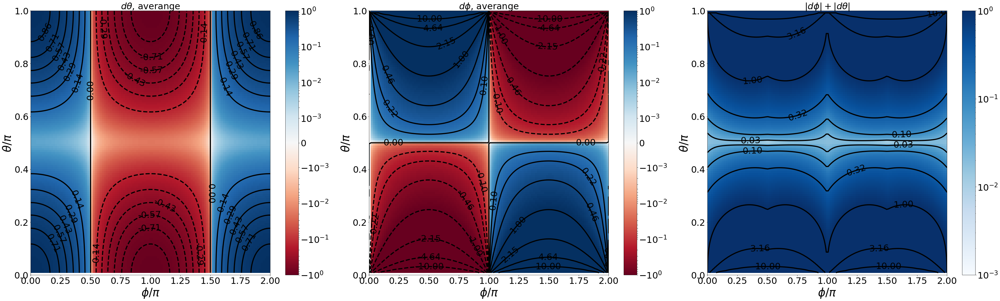

In [73]:
with open('dtheta_dphi.pickle', 'rb') as handle:
    tpick = pickle.load(handle)
ttheta, tphi, dtheta, dphi = tpick

fig = plt.figure(figsize=(50, 15))
fig.patch.set_facecolor('white')
axi, axj, axk = fig.subplots(nrows=1, ncols=3)
cmap=plt.get_cmap('RdBu')

# show dtheta
plt.sca(axi)
vmin, vmax = -1, 1
# im = axi.pcolor(tphi / np.pi, ttheta / np.pi, dtheta, vmin=vmin, vmax=vmax, cmap=cmap,)
# ticks = np.linspace(vmin, vmax, 9)
# fig.colorbar(im, ticks=ticks, ax=axi).ax.tick_params(labelsize=fontsize*0.8)
im = axi.pcolor(tphi / np.pi, ttheta / np.pi, dtheta, vmin=vmin, vmax=vmax, cmap=cmap, 
                norm=colors.SymLogNorm(linthresh=0.001, linscale=1, vmin=vmin, vmax=vmax))
fig.colorbar(im, ax=axi).ax.tick_params(labelsize=fontsize*0.8)
ticks = np.linspace(vmin, vmax, 15)
im = axi.contour(tphi / np.pi, ttheta / np.pi, dtheta, 
                 ticks, linewidths=fontsize*0.1, colors='k')
plt.clabel(im, fmt='%4.2f', colors='k', fontsize=fontsize*0.8, inline=0, rightside_up=1)
axi.set_xlabel('$\\phi / \pi$', size=fontsize)
axi.set_ylabel('$\\theta / \pi$', size=fontsize)
axi.set_title('$d\\theta$, averange', size=fontsize*0.8)
plt.xticks(fontsize=fontsize*0.8)
plt.yticks(fontsize=fontsize*0.8)
# show dphi
plt.sca(axj)
vmin, vmax = -1, 1
im = axj.pcolor(tphi / np.pi, ttheta / np.pi, dphi, vmin=vmin, vmax=vmax, cmap=cmap, 
                norm=colors.SymLogNorm(linthresh=0.001, linscale=1, vmin=vmin, vmax=vmax))
fig.colorbar(im, ax=axj).ax.tick_params(labelsize=fontsize*0.8)
n_tck_half = 7
ticks = np.hstack((-10 ** np.linspace(1, -1, n_tck_half), 0, 10 ** np.linspace(-1, 1, n_tck_half)))
linestyles = ['dashed'] * n_tck_half + ['solid'] * (n_tck_half + 1)
im = axj.contour(tphi / np.pi, ttheta / np.pi, dphi, 
                 ticks, linewidths=fontsize*0.1, colors='k', linestyles=linestyles)
plt.clabel(im, fmt='%4.2f', colors='k', fontsize=fontsize*0.8, inline=0, rightside_up=1)
axj.set_xlabel('$\\phi / \pi$', size=fontsize)
axj.set_ylabel('$\\theta / \pi$', size=fontsize)
axj.set_title('$d\\phi$, averange', size=fontsize*0.8)
plt.xticks(fontsize=fontsize*0.8)
plt.yticks(fontsize=fontsize*0.8)
# show dtheta*dphi
plt.sca(axk)
vmin, vmax = 1E-3, 1
im = axk.pcolor(tphi / np.pi, ttheta / np.pi, np.abs(dphi) + np.abs(dtheta), 
                vmin=vmin, vmax=vmax, cmap=plt.get_cmap('Blues'), 
                norm=colors.LogNorm(vmin=vmin, vmax=vmax))
fig.colorbar(im, ax=axk).ax.tick_params(labelsize=fontsize*0.8)
ticks = np.hstack((0, 10 ** np.linspace(np.log10(vmin), 1, 9)))
im = axk.contour(tphi / np.pi, ttheta / np.pi, np.abs(dphi) + np.abs(dtheta), 
                 ticks, linewidths=fontsize*0.1, colors='k')
plt.clabel(im, fmt='%4.2f', colors='k', fontsize=fontsize*0.8, inline=0, rightside_up=1)
axk.set_xlabel('$\\phi / \pi$', size=fontsize)
axk.set_ylabel('$\\theta / \pi$', size=fontsize)
axk.set_title('$|d\\phi| + |d\\theta|$', size=fontsize*0.8)
plt.xticks(fontsize=fontsize*0.8)
plt.yticks(fontsize=fontsize*0.8)
plt.tight_layout()


/home/zhangji/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:56: RuntimeWarning: divide by zero encountered in true_divide
/home/zhangji/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:56: RuntimeWarning: invalid value encountered in true_divide
/home/zhangji/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:57: RuntimeWarning: divide by zero encountered in true_divide


save table_data to dtheta_dphi2.pickle


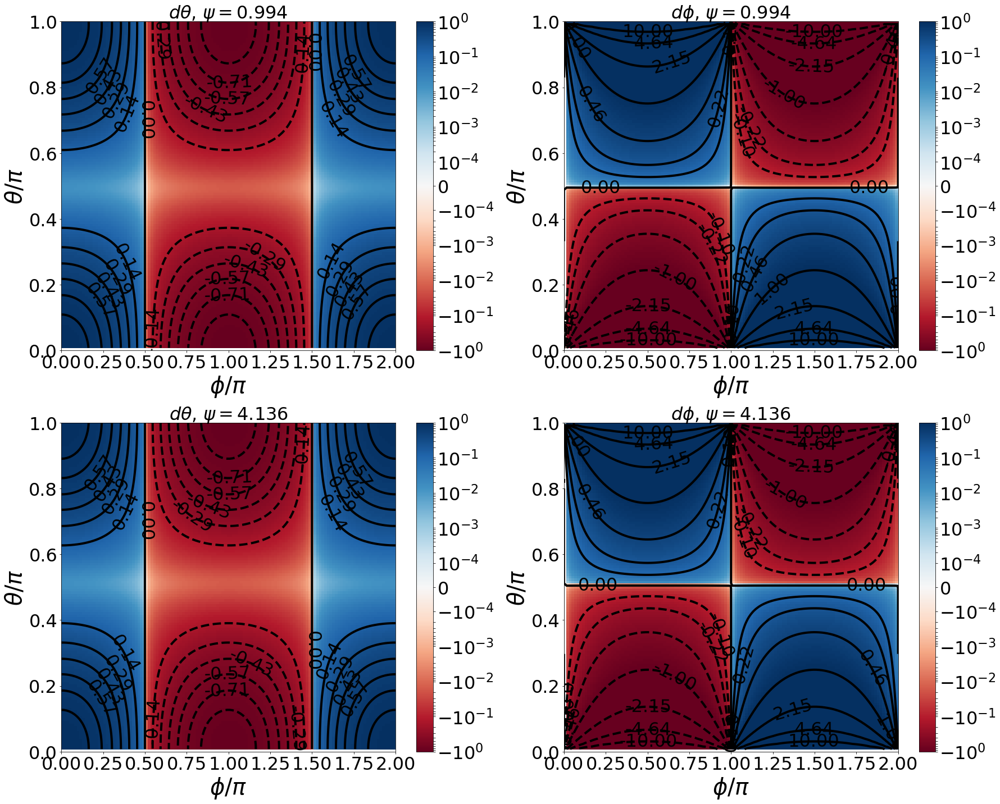

In [118]:
fig = plt.figure(figsize=(25, 20))
fig.patch.set_facecolor('white')
axs = fig.subplots(nrows=2, ncols=2)
cmap=plt.get_cmap('RdBu')
table_name = 'hlxB01_tau1a'
# t_path = '/home/zhangji/stokes_flow_master/src'

# Table  version, load date and interpolate. 
importlib.reload(jm)
ellipse_kwargs = {'name':         'ellipse',
                  'center':       np.zeros(3),
                  'norm':         np.array((1, 0, 0)),
                  'lateral_norm': np.array((0, 1, 0)),
                  'speed':        0,
                  'lbd':          np.nan, 
                  'table_name':   table_name, }
fileHandle = 'ShearTableProblem'
ellipse_obj = jm.TableObj(**ellipse_kwargs)
ellipse_obj.set_update_para(fix_x=False, fix_y=False, fix_z=False, update_order=1)
problem = jm.ShearTableProblem(name=fileHandle, planeShearRate=np.array((1, 0, 0)))
problem.add_obj(ellipse_obj)
intp_n_theta, intp_n_phi = 128, 128
ttheta, tphi = np.meshgrid(np.linspace(0, np.pi, intp_n_theta), np.linspace(0, 2 * np.pi, intp_n_phi))

dtheta_list = []
dphi_list = []
for tpsi, (axi, axj) in zip((np.pi * 0.3165, np.pi * 1.3165), axs):
    Table_Wx = []
    Table_Wy = []
    Table_Wz = []
    Table_dPx = []
    Table_dPy = []
    Table_dPz = []
    for theta, phi in zip(ttheta.flatten(), tphi.flatten()):
        P = np.array((np.sin(theta) * np.cos(phi), np.sin(theta) * np.sin(phi), np.cos(theta)))
        P2 = np.array((0, 1, 0))
        P2 = vector_rotation(P2, norm=np.array((0, 0, 1)), theta=tpsi)
        P2 = vector_rotation(P2, norm=np.array((0, 1, 0)), theta=theta)
        P2 = vector_rotation(P2, norm=np.array((0, 0, 1)), theta=phi)
        ref_U = ellipse_obj.get_velocity_at(np.zeros(3), P, P2, 0, 0)
        omega = ref_U[3:]
        dP = np.cross(omega, P)
        Table_Wx.append(omega[0])
        Table_Wy.append(omega[1])
        Table_Wz.append(omega[2])
        Table_dPx.append(dP[0])
        Table_dPy.append(dP[1])
        Table_dPz.append(dP[2])
    Wx = np.hstack(Table_Wx).reshape(ttheta.shape)
    Wy = np.hstack(Table_Wy).reshape(ttheta.shape)
    Wz = np.hstack(Table_Wz).reshape(ttheta.shape)
    dPx = np.hstack(Table_dPx).reshape(ttheta.shape)
    dPy = np.hstack(Table_dPy).reshape(ttheta.shape)
    dPz = np.hstack(Table_dPz).reshape(ttheta.shape)
    
    dtheta = -dPz / np.sin(np.abs(ttheta))
    dphi = (dPy * np.cos(tphi) - dPx * np.sin(tphi)) / np.sin(ttheta)
    dtheta_list.append(dtheta)
    dphi_list.append(dphi)
    # show dtheta
    plt.sca(axi)
    vmin, vmax = -1, 1
#     im = axi.pcolor(tphi / np.pi, ttheta / np.pi, dtheta, vmin=vmin, vmax=vmax, cmap=cmap, )
#     ticks = np.linspace(vmin, vmax, 9)
#     fig.colorbar(im, ticks=ticks, ax=axi).ax.tick_params(labelsize=fontsize*0.8)
    im = axi.pcolor(tphi / np.pi, ttheta / np.pi, dtheta, vmin=vmin, vmax=vmax, cmap=cmap, 
                    norm=colors.SymLogNorm(linthresh=0.0001, linscale=1, vmin=vmin, vmax=vmax))
    fig.colorbar(im, ax=axi).ax.tick_params(labelsize=fontsize*0.8)
    ticks = np.linspace(vmin, vmax, 15)
    im = axi.contour(tphi / np.pi, ttheta / np.pi, dtheta, 
                     ticks, linewidths=fontsize*0.1, colors='k')
    plt.clabel(im, fmt='%4.2f', colors='k', fontsize=fontsize*0.8, inline=0, rightside_up=1)
    axi.set_xlabel('$\\phi / \pi$', size=fontsize)
    axi.set_ylabel('$\\theta / \pi$', size=fontsize)
    axi.set_title('$d\\theta$, $\\psi=$%5.3f' % tpsi, size=fontsize*0.8)
    plt.xticks(fontsize=fontsize*0.8)
    plt.yticks(fontsize=fontsize*0.8)
    # show dphi
    plt.sca(axj)
    vmin, vmax = -1, 1
#     im = axj.pcolor(tphi / np.pi, ttheta / np.pi, dphi, vmin=vmin, vmax=vmax, cmap=cmap, 
#                     norm=colors.SymLogNorm(linthresh=0.1, linscale=1, vmin=vmin, vmax=vmax))
#     fig.colorbar(im, ax=axj).ax.tick_params(labelsize=fontsize*0.8)
    im = axj.pcolor(tphi / np.pi, ttheta / np.pi, dphi, vmin=vmin, vmax=vmax, cmap=cmap, 
                    norm=colors.SymLogNorm(linthresh=0.0001, linscale=1, vmin=vmin, vmax=vmax))
    fig.colorbar(im, ax=axj).ax.tick_params(labelsize=fontsize*0.8)
    n_tck_half = 7
    ticks = np.hstack((-10 ** np.linspace(1, -1, n_tck_half), 0, 10 ** np.linspace(-1, 1, n_tck_half)))
    linestyles = ['dashed'] * n_tck_half + ['solid'] * (n_tck_half + 1)
    im = axj.contour(tphi / np.pi, ttheta / np.pi, dphi, 
                     ticks, linewidths=fontsize*0.1, colors='k', linestyles=linestyles)
    plt.clabel(im, fmt='%4.2f', colors='k', fontsize=fontsize*0.8, inline=0, rightside_up=1)
    axj.set_xlabel('$\\phi / \pi$', size=fontsize)
    axj.set_ylabel('$\\theta / \pi$', size=fontsize)
    axj.set_title('$d\\phi$, $\\psi=$%5.3f' % tpsi, size=fontsize*0.8)
    plt.xticks(fontsize=fontsize*0.8)
    plt.yticks(fontsize=fontsize*0.8)
plt.tight_layout()

dtheta = np.mean(np.dstack(dtheta_list), axis=2)
dphi = np.mean(np.dstack(dphi_list), axis=2)
tpick = (ttheta, tphi, dtheta, dphi)
with open('dtheta_dphi2.pickle', 'wb') as handle:
    pickle.dump(tpick, handle, protocol=pickle.HIGHEST_PROTOCOL)
print('save table_data to dtheta_dphi2.pickle')